<a href="https://colab.research.google.com/github/BungPeerapat/Python_AI_Learn/blob/main/Data_Research_editPath_and_printImagesInFolder_deleteFiles.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#Run Code ตามลำดับที่เขียนมาให้เลยนะครับ

# **ถ้าจะ Run ไว้ในเครื่องตัวเอง รบกวน ให้ทำสำเนาไว้ที่ Drive ของตัวเองนะครับ**

In [1]:
!pip install botnoi==0.2.1

     |████████████████████████████████| 16.0MB 282kB/s 


In [85]:
from botnoi import scrape as sc
from botnoi import cv
import os

# Mount Drive


In [86]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


# ทำการ query

In [128]:
# กำหนดตัวแปร query = ชื่อของข้อมูลที่ต้องการค้นหา
# กำหนดชื่อ className = ชื่อโฟลเดอร์กับชื่อรูปที่เราต้องการจัดเก็บ

query = 'Ricinus communis L.'
className = 'Ricinus communis L.'

In [129]:
imgList = sc.get_image_urls(query,120) #เลขข้างหลัง เป็นการกำหนด range ของรูปภาพที่เราจะค้นหานะครับ ถ้าอยากได้ 50 รูปก็สามารถเปลี่ยนเลขข้างหลัง จาก 100 เป็น 50 ก็ได้ครับ

complete: 0.00%
complete: 53.33%
complete: 96.67%
completed


In [ ]:
#imgList2 = sc.get_image_urls('พืชไม่มีพิษ',100)

In [130]:
imgList #เป็นการเรียก url image ของ พืชมีพิษ

['https://c8.alamy.com/comp/R0TXBJ/spiny-green-seed-pods-of-a-castor-oil-plant-ricinus-communis-l-east-africa-R0TXBJ.jpg',
 'https://image.shutterstock.com/image-photo/ricinus-communis-bright-red-zinnia-260nw-628575458.jpg',
 'https://previews.123rf.com/images/syam/syam0711/syam071100166/2162879-ricinus-communis-l-tree.jpg',
 'https://storage.googleapis.com/powop-assets/PPA/0751_0800/h0769c_fullsize.jpg',
 'https://i.pinimg.com/736x/b2/6b/ae/b26bae986f88d7ab33a03523a6e99570.jpg',
 'https://plants.usda.gov/gallery/standard/rico3_002_shp.jpg',
 'https://image.shutterstock.com/image-photo/castor-oil-plant-ricinus-communis-260nw-150381698.jpg',
 'https://www.mdpi.com/toxins/toxins-11-00324/article_deploy/html/images/toxins-11-00324-ag.png',
 'https://i1.rgstatic.net/publication/257808838_Organization_and_Classification_of_Cytochrome_P450_Genes_in_Castor_Ricinus_communis_L/links/53cf5ab20cf25dc05cfae218/largepreview.png',
 'https://3.bp.blogspot.com/-UMvu1gLWb5o/T6pd5fA1QiI/AAAAAAAADPs/2ezz

In [ ]:
#imgList2 #เป็นการเรียก url image ของ พืชไม่มีพิษ

In [131]:
def getthumbdisplay(imgList):
  res = ''
  for img in imgList:
    res = res + gethtmlimage(img)
  return res

In [132]:
def gethtmlimage(imgurl):
  htmlTag = '''
  <a target="_blank" href="%s">
    <img src="%s" alt="Forest">
  </a>
  '''%(imgurl,imgurl)
  return htmlTag


In [133]:
import IPython
from google.colab import output
htmlimage = getthumbdisplay(imgList)
html = '''<style>
img {
  border: 1px solid #ddd; /* Gray border */
  border-radius: 4px;  /* Rounded border */
  padding: 5px; /* Some padding */
  width: 150px; /* Set a small width */
}

/* Add a hover effect (blue shadow) */
img:hover {
  box-shadow: 0 0 2px 1px rgba(0, 140, 186, 0.5);
}
</style>
<body>

%s

</body>'''%htmlimage
display(IPython.display.HTML(html))

In [134]:
'''
import IPython
from google.colab import output
htmlimage = getthumbdisplay(imgList2)
html = <style>
img {
  border: 1px solid #ddd; /* Gray border */
  border-radius: 4px;  /* Rounded border */
  padding: 5px; /* Some padding */
  width: 150px; /* Set a small width */
}

/* Add a hover effect (blue shadow) */
img:hover {
  box-shadow: 0 0 2px 1px rgba(0, 140, 186, 0.5);
}
</style>
<body>

%s

</body> %htmlimage
display(IPython.display.HTML(html))
'''

'\nimport IPython\nfrom google.colab import output\nhtmlimage = getthumbdisplay(imgList2)\nhtml = <style>\nimg {\n  border: 1px solid #ddd; /* Gray border */\n  border-radius: 4px;  /* Rounded border */\n  padding: 5px; /* Some padding */\n  width: 150px; /* Set a small width */\n}\n\n/* Add a hover effect (blue shadow) */\nimg:hover {\n  box-shadow: 0 0 2px 1px rgba(0, 140, 186, 0.5);\n}\n</style>\n<body>\n\n%s\n\n</body> %htmlimage\ndisplay(IPython.display.HTML(html))\n'

# **ทำ extract feature**

In [184]:
import urllib.request
import numpy
from numpy import random

In [186]:
def extractimagefeat(query,range):
  
  #create folder for images
  foldername = '/content/drive/MyDrive/Datasets/Image/'+ className      ### <== กำหนด folder path ไปที่ drive ของ boinoicv.fun6@gmail.com เลยค่ะ
  isdir = os.path.isdir(foldername)  
  #check if folder exist
  if not isdir:
    #create directory
    os.makedirs(foldername)

  #create folder for features 
  folderDataname = '/content/drive/MyDrive/Datasets/Data/'+ className   ### <== กำหนด folder path ไปที่ drive ของ boinoicv.fun6@gmail.com เลยค่ะ
  isdirdata = os.path.isdir(folderDataname) 
  if not isdirdata:
    #create directory
    os.makedirs(folderDataname)

  #get images from google search
  imglist = sc.get_image_urls(query,range)
  i = 1
  for img in imglist[0:range] :
    countani = 0
    emplyani = 10
    #extract image features from each images and save to files
    try:
      #Animation zone
      countani = 0
      emplyani = 12
      for ani in range(120):
        if(i%10 == 0):
          print("[ ",end="")
          countani += 1
          for anicount in range(countani):
            print("=",end="")
            emplyani -= 1
          for aniemply in range(emplyani):
            print(" ",end="")
          persentcal = int(i / 120 * 100)
          print(" ]"," || ","Percent Load : ",persentcal," % "," Data :",i,"/","120",end="")
          print("\n")
      countani = 0
      emplyani = 12

      #Animation zone
      #create image path and save
      savepath = foldername + '/' + className + '_'+str(i)+'.jpeg'
      urllib.request.urlretrieve(img, savepath)

      # create data path and save
      savepathData = folderDataname+ '/' + className + '_'+str(i)+'.p'
      
      a = cv.image(img)
      a.getresnet50()
      a.save(savepathData)
      i = i + 1
    except:
      i = i + 1
      pass
  return 'complete'

In [ ]:

countani = 0
emplyani = 12
for i in range(120):
  if(i%10 == 0):
    print("[ ",end="")
    countani += 1
    for ani in range(countani):
      print("=",end="")
    emplyani -= 1
    for ani_second in range(emplyani):
      print(" ",end="")
    persentcal = int(i / 120 * 100)
    print(" ]"," || ","Percent Load : ",persentcal," % ",i,"/","120",end=" ")
    print("\n")
countani = 0
emplyani = 12

In [137]:

extractimagefeat(query,120) #extractimagefeat('ชื่อของข้อมูลที่ต้องการค้นหา',ขอบเขตของรูปที่ต้องการหา)

complete: 0.00%
complete: 53.33%
complete: 72.50%
completed
[ 
[ 
[ 
[ 
[ 
[ 
[ 
[ 
[ 
[ 
[ 
[ 
[ 
[ 
[ 
[ 
[ 
[ 
[ 
[ 
[ 
[ 
[ 
[ 
[ 
[ 
[ 
[ 
[ 
[ 
[ 
[ 
[ 
[ 
[ 
[ 
[ 
[ 
[ 
[ 
[ 
[ 
[ 
[ 
[ 
[ 
[ 
[ 
[ 
[ 
[ 
[ 
[ 
[ 
[ 
[ 
[ 
[ 
[ 
[ 
[ 
[ 
[ 
[ 
[ 
[ 
[ 
[ 
[ 
[ 
[ 
[ 
[ 
[ 
[ 
[ 
[ 
[ 
[ 
[ 
[ 
[ 
[ 
[ 
[ 
[ 
[ 
[ 
[ 
[ 
[ 
[ 
[ 
[ 
[ 
[ 
[ 
[ 
[ 
[ 
[ 
[ 
[ 
[ 
[ 
[ 
[ 
[ 
[ 
[ 
[ 
[ 
[ 
[ 
[ 
[ 
[ 
[ 
[ 
[ 


'complete'

In [ ]:
#extractimagefeat('พืชไม่มีพิษ')

In [ ]:
#command to clear or files
#rm -rf *

# ลอง plot เพื่อคัดรูปที่ใช้ไม่ได้ออก

loading image :  Ricinus communis L._74.jpeg  has an error


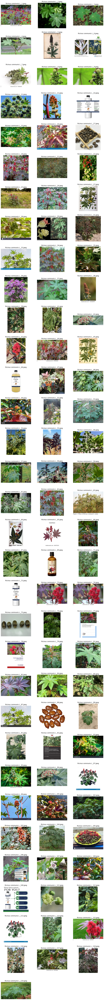

In [139]:
# หลังจากลบรูปแล้วสามารถกดซ้ำได้เพื่อเช็คความเรียบร้อยค่ะ

import matplotlib.pyplot as plt
import PIL
%matplotlib inline

plt.figure(figsize=(15, 150))
for i, imgName in enumerate(os.listdir('/content/drive/MyDrive/Datasets/Image/'+className)) :
  #print(imgName)
  try:
    img = PIL.Image.open(os.path.join('/content/drive/MyDrive/Datasets/Image/'+className, imgName))
  except:
    print('loading image : ', imgName ,' has an error')
  plt.subplot(len(os.listdir('/content/drive/MyDrive/Datasets/Image/'+className))//3 + 1, 3, i+1)
  plt.imshow(img)
  plt.axis('off')
  plt.title(imgName.split('/')[-1])
plt.show()

In [ ]:
#rm -rf /content/drive/MyDrive/Datasets/Data/Jatropha\ podagrica\ Hook

In [ ]:
#rm -rf /content/drive/MyDrive/Datasets/Image/Jatropha\ podagrica\ Hook

In [122]:
# เช็คจากรูปที่ plot ออกมา ต้องการลบรูปไหน ใส่ index ของรูปใน list ด้านล่างเลยนะคะ
indexToDelete = [1,3,6,8,9,13,17,18,19,24,29,32,33,34,43,44,47,49,54,55,57,59,62,63,66,79,82,87,94,92,102,103,107,109,111,113,116,119] 

In [123]:
for idx in indexToDelete :
  imgFileName = '/content/drive/MyDrive/Datasets/Image/'+ className+'/'+className + '_'+str(idx)+'.jpeg'
  dataFileName = '/content/drive/MyDrive/Datasets/Data/'+ className+'/'+className + '_'+str(idx)+'.p'
  
  if os.path.exists(imgFileName) :
    #print(imgFileName, ' exists')
    os.remove(imgFileName)

  if os.path.exists(dataFileName) :
    #print(dataFileName, ' exists')
    os.remove(dataFileName)

# Create Dataset

In [124]:
"""
import glob
import pandas as pd
import pickle
def createdataset():
  imgfolder = glob.glob('images/*')
  for cls in imgfolder:
    clsset = pd.DataFrame()
    pList = glob.glob(cls+'/*')
    featvec = []
    dataset = []
    for p in pList:
      dat = pickle.load(open(p,'rb'))
      featvec.append(dat.resnet50)

    clsset['feature'] = featvec
    cls = cls.split('/')[-1]
    clsset['label'] = cls
    dataset.append(clsset)
"""

"\nimport glob\nimport pandas as pd\nimport pickle\ndef createdataset():\n  imgfolder = glob.glob('images/*')\n  for cls in imgfolder:\n    clsset = pd.DataFrame()\n    pList = glob.glob(cls+'/*')\n    featvec = []\n    dataset = []\n    for p in pList:\n      dat = pickle.load(open(p,'rb'))\n      featvec.append(dat.resnet50)\n\n    clsset['feature'] = featvec\n    cls = cls.split('/')[-1]\n    clsset['label'] = cls\n    dataset.append(clsset)\n"

In [119]:
"""
dataset = createdataset()
"""

'\ndataset = createdataset()\n'

In [120]:
"""
dataset
"""

'\ndataset\n'

In [121]:
"""
fimgfolder = glob.glob('images/*')
for cls in imgfolder:
  imgList = glob.glob(cls+'/*')
imgList
"""

"\nfimgfolder = glob.glob('images/*')\nfor cls in imgfolder:\n  imgList = glob.glob(cls+'/*')\nimgList\n"